# Advanced Lane Detection

In this project, the goal is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car.

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
# Include packages
import numpy as np
import cv2
import glob
import ntpath
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [2]:
# Helper functions 
def path_leaf(path):
    """
    Extract filename from path.
    Return filename.
    """
    head, tail = ntpath.split(path)
    return tail or ntpath.basename(head)

from timeit import default_timer as timer
class benchmark(object):
    """
    Benchmark class measuring the time taken to execute a piece of code.
    """
    def __init__(self, msg, fmt="%0.3g"):
        self.msg = msg
        self.fmt = fmt

    def __enter__(self):
        self.start = timer()
        return self

    def __exit__(self, *args):
        t = timer() - self.start
        print(("%s : " + self.fmt + " seconds") % (self.msg, t))
        self.time = t

## Camera calibration

Camera calibration takes place in two steps:
1. Use chessboard images to collect image points and object points
2. Use image  and object points to calibrate the camera using *cv2.calibrateCamera*

The following cell iterates over a set of chessboard images finding corner points an deriving object and image points. Once all images have been processed, the camera matrix **mtx** and the distortion coefficients **dist** are returned. The camera matrix and the distortion coefficients are later used to undistort raw images coming from the camera.

In [3]:
def calibrate_camera(cal_images_path='camera_cal/calibration*.jpg', nx=9, ny=6, show_images=False, warnings=False):
    """
    Calibrate the camera using calibration images found in 'cal_images_path'.
    Return the camera matrix and the distortion coefficients.
    """
    objpoints, imgpoints = [], []
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    calibration_images = glob.glob(cal_images_path)
    for filename in calibration_images:
        image = mpimg.imread(filename)
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray_image, (nx, ny), None)

        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
            if show_images == True:
                image = cv2.drawChessboardCorners(image, (nx, ny), corners, ret)
                plt.figure(figsize=(6, 3))
                plt.xticks([])
                plt.yticks([])
                plt.imshow(image)
                plt.tight_layout()
                
        if ret == False and warnings == True:
            print('No corners found: {}'.format(filename))

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray_image.shape[::-1], None, None)
    
    return mtx, dist

In [4]:
# Camera calibration
mtx, dist = calibrate_camera()
print('Calibration complete')

Calibration complete


## Image undistortion

The following cell provides a function which, given a **calibration matrix** and **distortion coefficients** returns an undistorted image.

In [5]:
def image_undistort(image, mtx, dist):
    """
    Undistort an image given the camera matrix and the distortion coefficients.
    Return the undistorted image.
    """
    return cv2.undistort(image, mtx, dist)

### Sample undistorted images

In [6]:
def plot_images(image1, title1, cmap1, image2, title2, cmap2, fontsize=12):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))
    f.tight_layout()
    
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.imshow(image1, cmap=cmap1)
    ax1.set_title(title1, fontsize=fontsize)
    
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.imshow(image2, cmap=cmap2)
    ax2.set_title(title2, fontsize=fontsize)
    
    plt.tight_layout()

## Image thresholding

The following cell includes a set of function which create a binary image by applying different thresholding techniquest to the original image:
* **abs_sobel_thresh**: applies a threshold to the gradient of the image along the X or Y axis
* **mag_thresh**: applies a threshold to the gradient magnitude of the image along both the X and Y axis
* **dir_thresh**: applies a threshold to the gradient direction of the image
* **hls_s_thresh**: applies a threshold on the Saturation (S) channel of an image converted to HLS colorspace
* **gray_thresh**: applies a threshold on a grayscale image
* **rgb_r_thresh**: applies a threshold on the Red (R) channel of an image
* **lab_b_thresh**: applies a threshold on the b channel of an image converted to Lab colorspace

In [78]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    """
    Absolute gradient image thresholding along x or y.
    Return a binary image.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x': 
        dx, dy = 1, 0
    else:
        dx, dy = 0, 1
    sobel_der = cv2.Sobel(gray, cv2.CV_64F, dx, dy)
    abs_sobel = np.absolute(sobel_der)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary


def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    """
    Gradient magnitude image thresholding. 
    Return a binary image.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelxy = np.sqrt(sobelx ** 2 + sobely ** 2)
    scale_factor = np.max(abs_sobelxy)/255 
    gradmag = (abs_sobelxy/scale_factor).astype(np.uint8) 
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    return mag_binary


def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    """
    Gradient direction image thresholding.
    Return a binary image.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_dir = np.arctan2(abs_sobely, abs_sobelx) 
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    return dir_binary


def hls_s_thresh(img, thresh=(0, 255)):
    """
    HLS Saturation image thresholding.
    Return a binary image.
    """
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S < thresh[1])] = 1
    return binary

def hls_l_thresh(img, thresh=(220, 255)):
    """
    HLS L image thresholding.
    Return binary image.
    """
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]
    L = L * (255/np.max(L))
    binary = np.zeros_like(L)
    binary[(L > thresh[0]) & (L <= thresh[1])] = 1
    return binary

def gray_thresh(img, thresh=(0, 255)):
    """
    Grayscale image thresholding.
    Return a binary image.
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    binary = np.zeros_like(gray)
    binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary

def rgb_r_thresh(img, thresh=(0, 255)):
    """
    RGB Red image thresholding.
    Return a binary image.
    """
    R = img[:,:,0]
    binary = np.zeros_like(R)
    binary[(R > thresh[0]) & (R <= thresh[1])] = 1
    return binary

def lab_b_thresh(img, thresh=(0, 255)):
    """
    Lab B image thresholding.
    Return a binary image.
    """
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    b = lab[:,:,2]
    if np.max(b) > 175:
        b = b * (255/np.max(b))
    binary = np.zeros_like(b)
    binary[(b > thresh[0]) & (b <= thresh[1])] = 1
    return binary

def hsv_v_thresh(img, thresh=(0, 255)):
    """
    HSV V image thresholding.
    Return a binary image.
    """
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    v = hsv[:,:,2]
    binary = np.zeros_like(v)
    binary[(v > thresh[0]) & (v <= thresh[1])] = 1
    return binary

def rgb_white(img):
    """
    RGB white detection.
    Return a binary image.
    """
    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]
    
    white = np.bitwise_and(R, np.bitwise_and(G, B))
    
    return white

In [121]:
def region_of_interest(image, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(image)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(image.shape) > 2:
        channel_count = image.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

def image_mask(image):
    """
    Mask an image isolating a region of the image delimited by a trapezoid.
    Return th masked image.
    """
    left_top = [520, 460]
    right_top = [720, 460]
    right_bottom = [1180, 720]
    left_bottom = [100, 720]
    vertices = np.array([left_bottom, left_top, right_top, right_bottom])
    return region_of_interest(image, np.int32([vertices]))

## Perspective transform

The following cell provides a function that performs a perspective transform of an image returning the new image, the perspective transform matrix and its inverse matrix.
After performing a perspective transform of the input image we get a Bird's Eye view of the original image.

In [122]:
def image_warp(image):
    """
    Apply perspective transformation to an image to get a Bird's Eye View.
    Return Bird's Eye View, M and Minv.
    """
    src = np.float32([[520, 460],
                      [720, 460],
                      [1180, 720],
                      [100, 720]])
    dst = np.float32([[60, 0],
                      [1220,0],
                      [1120,720],
                      [240, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped_image = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    return warped_image, M, Minv

In [123]:
def plot_pipeline(pipeline, titles, rows=3, fontsize=36):
    """
    Plot images in the pipeline.
    """
    cols = int(float(len(pipeline)) / rows)
    
    if rows * cols != len(pipeline):
        print('{0} x {1} = {2}'.format(rows, cols, len(pipeline)))
    
    f, axs = plt.subplots(rows, cols, figsize=(40, 20))
    f.tight_layout()
    
    axs = axs.ravel()
    
    for i in range(len(pipeline)):
        cmap = 'gray'
        if titles[i] == 'Original' or titles[i] == 'Undistorted' or titles[i] == 'Final':
            cmap = 'jet'
        axs[i].set_xticks([])
        axs[i].set_yticks([])
        axs[i].imshow(pipeline[i], cmap=cmap)
        axs[i].set_title(titles[i], fontsize=fontsize)
    plt.tight_layout()

In [124]:
def save_pipeline(filename, pipeline, titles, path):
    """
    Save pipeline images to file.
    """
    for image, title in zip(pipeline, titles):
        cmap = 'gray'
        if title == 'Original' or title == 'Undistorted' or title == 'Final':
            cmap = 'jet'
        out_filename = path_leaf(filename).split('.')[0] + '_' + title + '.png'
        mpimg.imsave(os.path.join(path, out_filename), image, cmap=cmap)

In [125]:
def slide_window_search(binary_image):
    """
    Find and fit left and right lines.
    Return fit coefficients and nonzero indices.
    """
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_image[binary_image.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_image = np.dstack((binary_image, binary_image, binary_image)) * 255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_image.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_image.shape[0] - (window + 1) * window_height
        win_y_high = binary_image.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_image,(win_xleft_low, win_y_low),(win_xleft_high, win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_image,(win_xright_low, win_y_low),(win_xright_high, win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds

In [126]:
def simple_window_search(binary_image, left_fit, right_fit, margin=40):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy + left_fit[2] - margin)) &
                      (nonzerox < (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0] *(nonzeroy**2) + right_fit[1] * nonzeroy + right_fit[2] - margin)) &
                       (nonzerox < (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    left_fit, right_fit = None, None
    
    left_fit, right_fit = None, None
    
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds

In [127]:
def fit_lines(binary_image, left_fit, right_fit):
    # If no left or right fit use sliding window search
    if left_fit is None or right_fit is None:
        lfit, rfit, linds, rinds = slide_window_search(binary_image)
    else:
        # If we have both left and right fit use simplified window search
        lfit, rfit, linds, rinds = simple_window_search(binary_image, left_fit, right_fit)
        # If simplified window seach fails fall back to sliding window search
        if lfit is None or rfit is None:
            lfit, rfit, linds, rinds = slide_window_search(binary_image)
        
    return lfit, rfit, linds, rinds  

## Draw lane in original image view

The following cell provides the **image_lane** function which, given the undistorted input image, draws the lane on top of it. It needs as input, also, the left and right lines coefficients and the inverse perspective transform matrix.

In [128]:
def image_lane(image, undist_image, left_fit, right_fit, Minv, fillcolor=(0, 255, 0), left_color=(255, 0, 0), right_color=(0, 0, 255), tickness=20):
    """
    Draw lanes on the image.
    Return image with lanes drwan on top of the undistorted image.
    """
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), fillcolor)
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=left_color, thickness=tickness)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=right_color, thickness=tickness)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    return cv2.addWeighted(undist_image, 1, newwarp, 0.2, 0)

## Curvature and distance from the center

The following cells provide the **compute_curvature_and_distance** and **image_curv_dist** functions. The first computes the left and right curvature and the the vehicle position as distance of the vehicle from the center. It requies the left and right line fit coefficients and indices which are returned by function *fit_lines* above. The second plots these values on top of an image in such a way to diplay curvature and distance in the final image and video.

In [129]:
def compute_curvature_and_distance(image, left_fit, right_fit, left_inds, right_inds):
    """
    Compute left and right lines curvature and distance from the center.
    Return left curvature, right curature and distance from the center.
    """
    # Define conversion in x and y from pizel space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/700 # meters per pizel in x dimension, lane width is 12 ft = 3.7 meters
    left_curvrad, right_curvrad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I choose the max y-value, corresponding to the bottom of the image
    h = image.shape[0]
    ploty = np.linspace(0, h-1, num=h)
    y_eval = np.max(ploty)
    
    # Identify the x and y positions of all nonzero pizels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_inds]
    lefty = nonzeroy[left_inds]
    rightx = nonzerox[right_inds]
    righty = nonzeroy[right_inds]
    
    left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    left_curvrad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2 * left_fit_cr[0])
    right_curvrad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2 * right_fit_cr[0])
    
    car_pos = image.shape[1]/2
    left_fit_x_int = left_fit[0] * h**2 + left_fit[1] * h + left_fit[2]
    right_fit_x_int = right_fit[0] * h**2 + right_fit[1] * h + right_fit[2]
    lane_center_pos = (right_fit_x_int + left_fit_x_int) / 2
    center_dist = (car_pos - lane_center_pos) * xm_per_pix
    
    return left_curvrad, right_curvrad, center_dist

In [130]:
def image_curv_dist(image, left_curvrad, right_curvrad, center_dist, text_color = (200, 255, 255)):
    """
    Plot curvature and distance from the center on the image.
    Return image with curvature and distance from the center drawn on top.
    """
    text_font, text_color = cv2.FONT_HERSHEY_DUPLEX, text_color
    curv_text = 'Curve radius left: {0:04.2f} m right: {1:04.2f} m'.format(left_curvrad, right_curvrad)
    cv2.putText(image, curv_text, (40, 70), text_font, 1, text_color, 2, cv2.LINE_AA)
    dist_text = 'Distance: {:04.3f} m'.format(center_dist)
    cv2.putText(image, dist_text, (40, 120), text_font, 1, text_color, 2, cv2.LINE_AA)
    return image

In [133]:
def image_thresholds(image, ksize=3, return_type='all'):
    """
    Apply different gradient thresholding techniques to the image.
    Return a binary image.
    """
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(30, 255))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(70, 255))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, thresh=(50, 255))
    dir_binary = dir_thresh(image, sobel_kernel=ksize, thresh=(0.60, 1.30))
    #r_binary = rgb_r_thresh(image, thresh=(200, 255))
    b_binary = lab_b_thresh(image, thresh=(190, 255))
    s_binary = hls_s_thresh(image, thresh=(190, 255))
    #w_binary = rgb_white(image)
    l_binary = hls_l_thresh(image, thresh=(190, 255))

    combined = np.zeros_like(b_binary)
    #combined[(b_binary == 1) | (s_binary == 1) | (l_binary == 1)] = 1
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (s_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (b_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (l_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    if return_type == 'all':
        return combined, gradx, grady, mag_binary, dir_binary, b_binary, s_binary, l_binary
    else:
        return combined

## Full pipeline on sample images

In the folloing cell the full pipeline is tested on sample input images.

C:\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


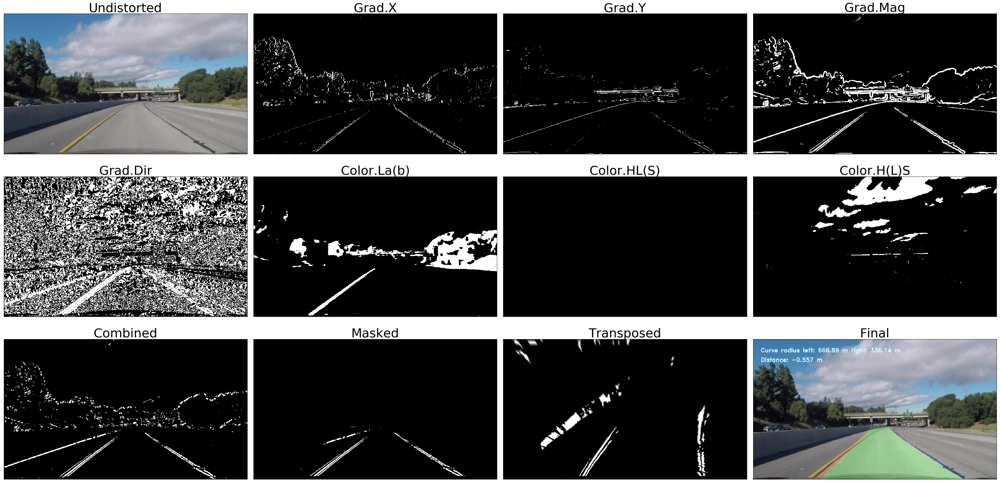

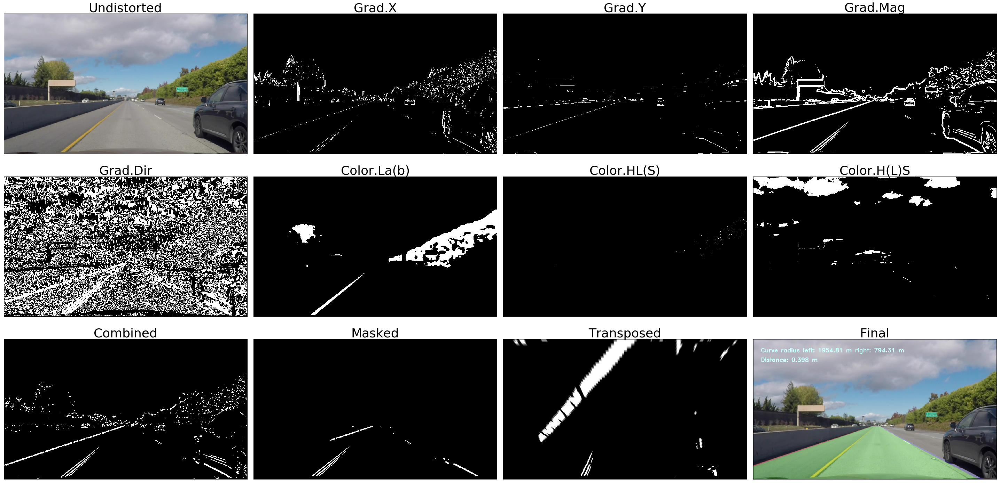

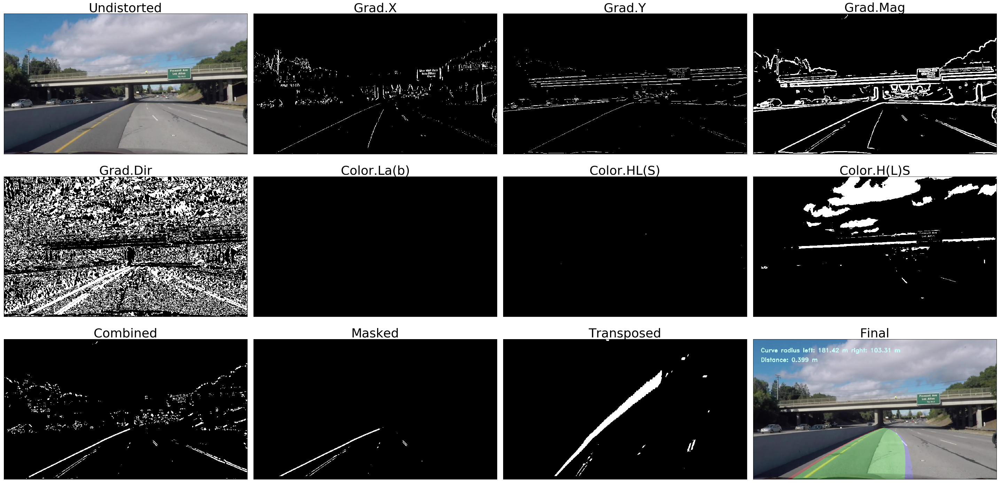

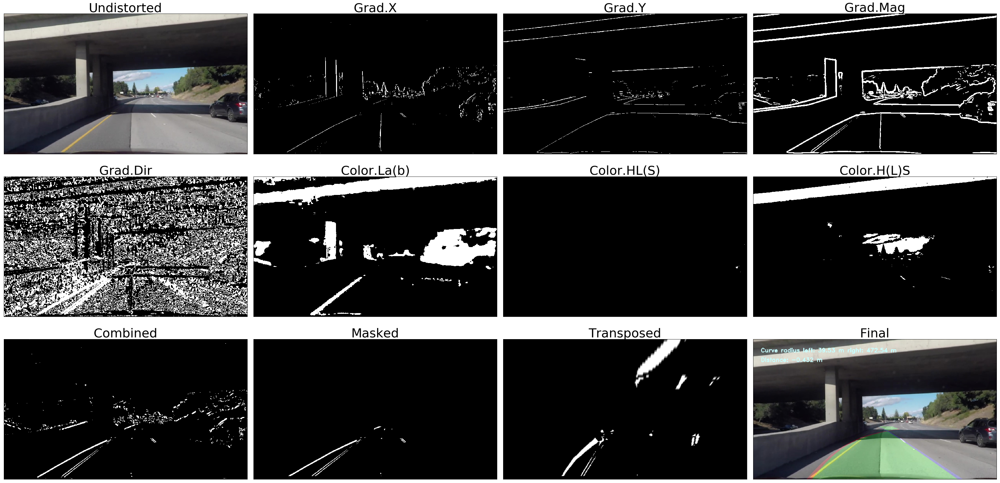

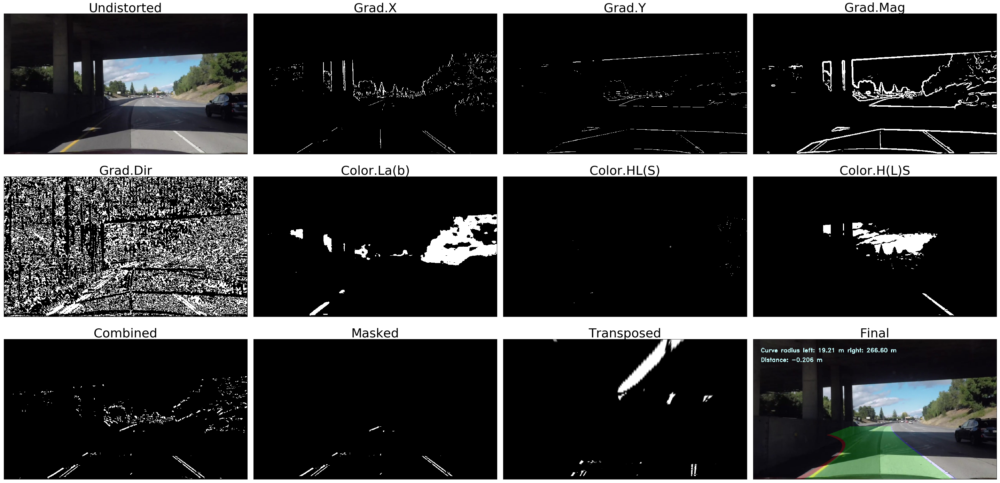

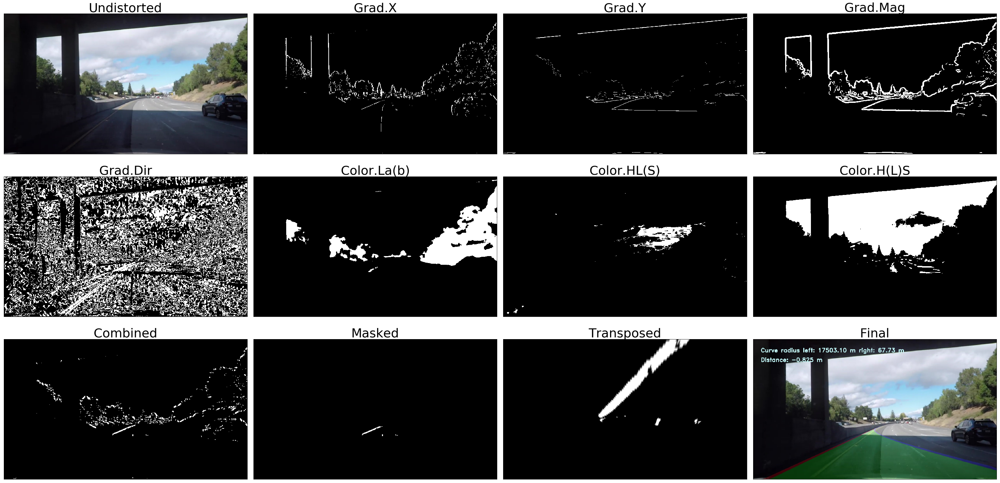

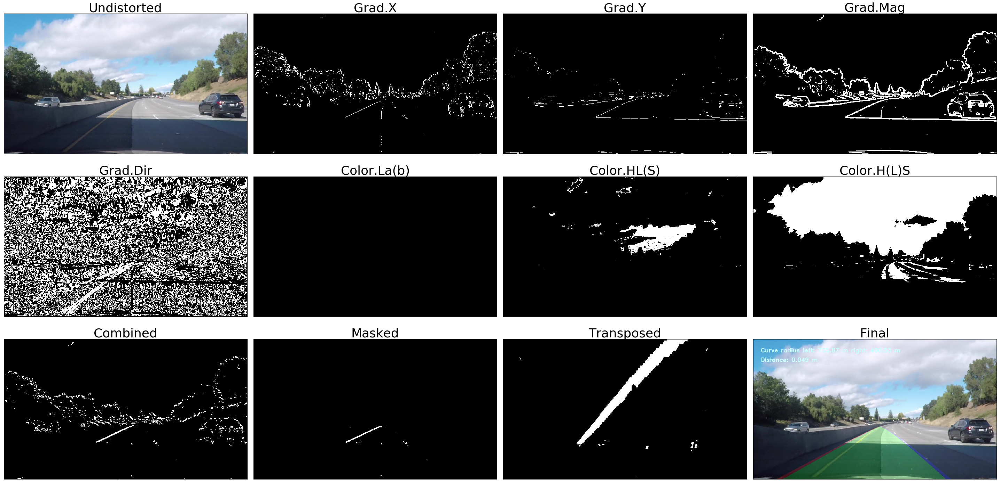

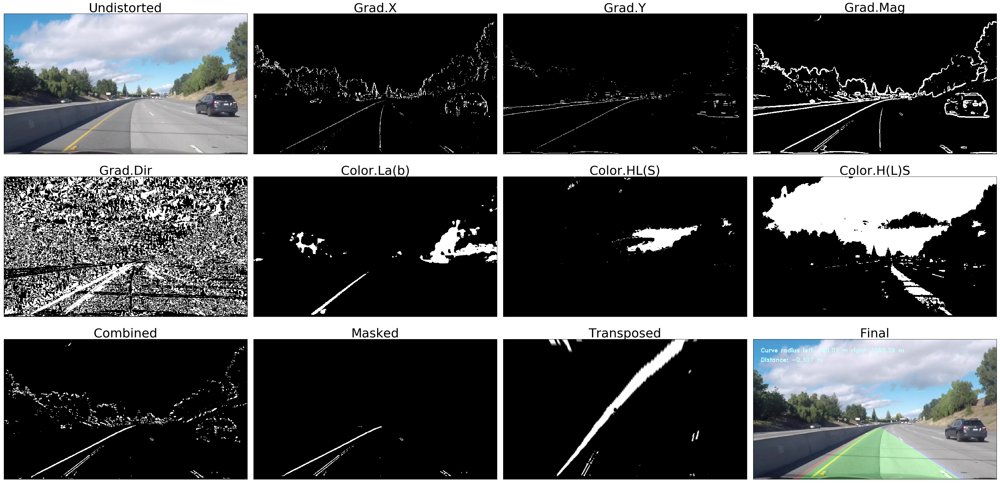

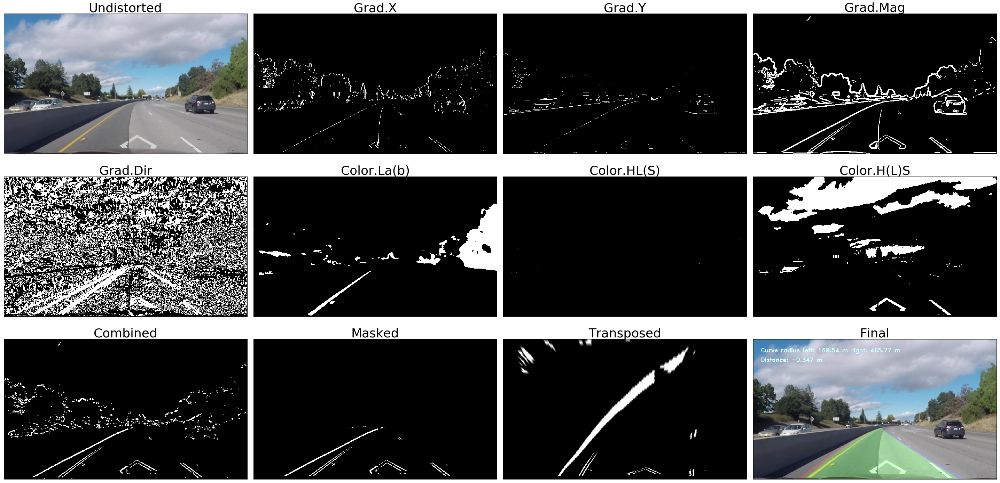

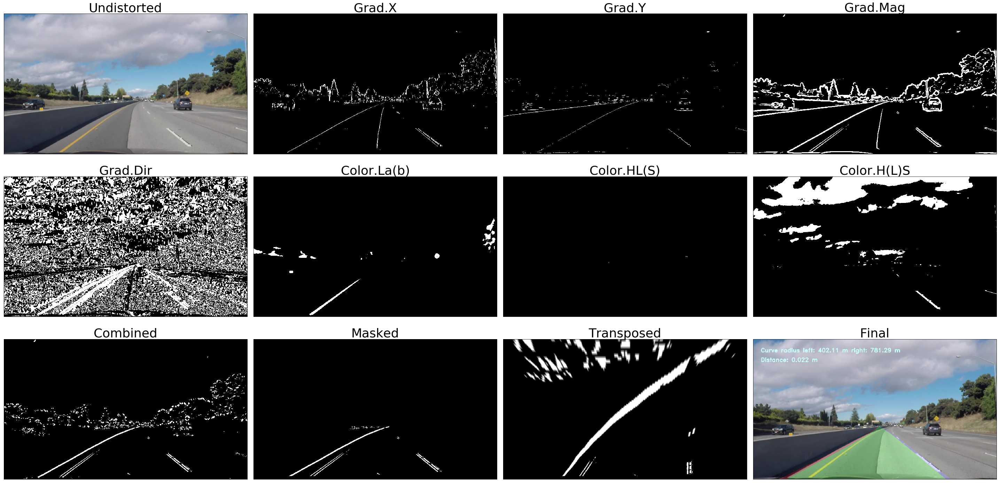

In [134]:
# Sobel kernel size
ksize=23

# Test the pipeline on sample images
test_images = glob.glob('challenge_images/*.jpg')
for filename in test_images:
    # Init left and right fit to None for every new image
    left_fit, right_fit = None, None
    # Read test image
    image = mpimg.imread(filename)
    # Undistort original image
    undist_image = image_undistort(image, mtx, dist)
    # Apply some thresholding using different techniques
    comb_image, gradx_image, grady_image, gradmag_image, graddir_image, b_image, s_image, l_image = image_thresholds(undist_image, ksize=ksize)
    # Mask image applying region of interest
    masked_image = image_mask(comb_image)
    # Transform image to Bird's Eye view
    warped_image, M, Minv = image_warp(masked_image)
    # Compute left and right lines fit
    left_fit, right_fit, left_inds, right_inds = fit_lines(warped_image, left_fit, right_fit)
    # Image back from Bird's Eye view to original view
    lane_image = image_lane(warped_image, undist_image, left_fit, right_fit, Minv)
    # Compute curvature and distance from the center
    left_curvrad, right_curvrad, center_dist = compute_curvature_and_distance(warped_image, left_fit, right_fit, left_inds, right_inds)
    lane_image = image_curv_dist(lane_image, left_curvrad, right_curvrad, center_dist)
    # Plot pipeline images for sample test images
    pip = [undist_image, gradx_image, grady_image, gradmag_image, graddir_image, b_image, s_image, l_image, comb_image, masked_image, warped_image, lane_image]
    titles = ['Undistorted', 'Grad.X', 'Grad.Y', 'Grad.Mag', 'Grad.Dir', 'Color.La(b)', 'Color.HL(S)', 'Color.H(L)S', 'Combined', 'Masked', 'Transposed', 'Final']
    plot_pipeline(pip, titles)
    # Save images to file
    save_pipeline(filename, pip, titles, path='./challenge_output_images/')

## Pipeline function

The following cell provides the **pipeline** function which applies the full pipeline processing to an input image.
It also needs, as input, the camera matrix and distortion coefficients computed while calibrating the camera.

In [20]:
# Apply the full pipeline to each image
def pipeline(image, mtx=mtx, dist=dist):
    """
    Apply the full pipeline to an image.
    Return image with lanes.
    """
    global left_line_fit
    global right_line_fit
    left_fit = left_line_fit
    right_fit = right_line_fit
    # Undistort the original image
    undist_image = image_undistort(image, mtx, dist)
    # Apply gradient and color thresholding
    comb_image = image_thresholds(undist_image, ksize=ksize, return_type='')
    # Isolate the region of interest
    masked_image = image_mask(comb_image)
    # Apply perspective transformation
    warped_image, M, Minv = image_warp(masked_image)
    # Find left and right lines fit
    left_fit, right_fit, left_inds, right_inds = fit_lines(warped_image, left_fit=left_fit, right_fit=right_fit)
    # Draw lane lines using best fits for left and right lines
    lane_image = image_lane(warped_image, undist_image, left_fit, right_fit, Minv)
    # Compute curvature and distance from the center 
    left_curvrad, right_curvrad, center_dist = compute_curvature_and_distance(warped_image, left_fit, right_fit, left_inds, right_inds)
    # Display curvature and distance from the center on the image
    lane_image = image_curv_dist(lane_image, left_curvrad, right_curvrad, center_dist)
    left_line_fit = left_fit
    right_line_fit = right_fit
    return lane_image

# Measure pipeline performance on test images
test_images = glob.glob('test_images/*.jpg')
with benchmark('Pipeline: {} images'.format(len(test_images))) as bench:
    for filename in test_images:
        left_line_fit, right_line_fit = None, None
        image = mpimg.imread(filename)
        final_image = pipeline(image, mtx, dist)

C:\Miniconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Pipeline: 8 images : 3.79 seconds


## Process the project video

The following cell includes the code piping the project video through the processing pipeline. It produces and output
video which overlaps the original video with the detected lane, the curvature and distance from the center of the vehicle.

In [21]:
### Import everything needed to edit/save/watch video clips
#from moviepy.editor import VideoFileClip
#from IPython.display import HTML
#left_line_fit, right_line_fit = None, None
#video_output = 'challenge_video_lanes.mp4'
#clip1 = VideoFileClip('challenge_video.mp4')
#video_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
#%time video_clip.write_videofile(video_output, audio=False)